# **Checklist**

o que falta fazer: 

- construir gráficos para a análise desses dados
- ver se precisa tirar algum outlier (dados discrepantes ou inconsistentes) -> *acho que não precisa pq o outlier que tem é justamente no preço e nós não vamos usar essa coluna*
- transformação dos dados usando algum encoder (transformar categóricos em numéricos)
- dividir em treino e teste (em porcentagem, ex: 20 pra teste e 80 pra treino)
- previsão do preço
- regressão linear
- gráficos sobre os ultimos 2
- finalizar com comentários

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from scipy.stats import norm
from scipy import stats
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from math import sqrt
from sklearn.metrics import r2_score

In [2]:
df = pd.read_csv("/content/AB_NYC_2019.csv")
df

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149.0,1.0,9.0,2018-10-19,0.21,6.0,365.0
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225.0,1.0,45.0,2019-05-21,0.38,2.0,355.0
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150.0,3.0,0.0,NaN,NaN,1.0,365.0
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89.0,1.0,270.0,2019-07-05,4.64,1.0,194.0
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80.0,10.0,9.0,2018-11-19,0.10,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36329,28910899,"Private room in large, central Nolita penthouse!",153154549,Sarah,Manhattan,Nolita,40.72135,-73.99426,Private room,140.0,3.0,2.0,2018-10-15,0.22,1.0,0.0
36330,28910978,Artistic house with murals,52044518,Veronica,Queens,East Elmhurst,40.76173,-73.87417,Private room,65.0,1.0,58.0,2019-07-08,6.19,1.0,47.0
36331,28911697,Cozy Artist Room,70230403,Sonya,Brooklyn,Bushwick,40.69677,-73.92688,Private room,57.0,1.0,1.0,2018-10-22,0.12,1.0,0.0
36332,28911775,LUXURY PRIVATE BEDROOM & Bath Mins from JFK,217621677,Joseph,Queens,St. Albans,40.68754,-73.77488,Private room,50.0,1.0,16.0,2019-07-07,1.78,4.0,137.0


In [3]:
df.isnull().sum()

id                                   0
name                                16
host_id                              0
host_name                           21
neighbourhood_group                  1
neighbourhood                        1
latitude                             1
longitude                            1
room_type                            1
price                                1
minimum_nights                       1
number_of_reviews                    1
last_review                       5802
reviews_per_month                 5802
calculated_host_listings_count       1
availability_365                     1
dtype: int64

In [4]:
df.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                             float64
minimum_nights                    float64
number_of_reviews                 float64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count    float64
availability_365                  float64
dtype: object

In [5]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,3.633400e+04,3.633400e+04,36333.000000,36333.000000,36333.000000,36333.000000,36333.000000,30532.000000,36333.000000,36333.000000
mean,1.422079e+07,4.471385e+07,40.728640,-73.953169,147.358022,6.905651,29.448793,1.142241,3.941761,101.593427
std,8.427656e+06,5.381382e+07,0.054364,0.044079,230.736064,21.098663,49.930208,1.480552,13.425832,129.733033
min,2.539000e+03,2.438000e+03,40.499790,-74.242850,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,6.967039e+06,5.905590e+06,40.689100,-73.982400,69.000000,2.000000,1.000000,0.140000,1.000000,0.000000
50%,1.421927e+07,2.213123e+07,40.722280,-73.955970,105.000000,3.000000,8.000000,0.490000,1.000000,18.000000
75%,2.152909e+07,6.139196e+07,40.763490,-73.938240,170.000000,5.000000,35.000000,1.660000,2.000000,201.000000
max,2.891183e+07,2.179093e+08,40.911690,-73.712990,10000.000000,1250.000000,629.000000,19.750000,232.000000,365.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36334 entries, 0 to 36333
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              36334 non-null  int64  
 1   name                            36318 non-null  object 
 2   host_id                         36334 non-null  int64  
 3   host_name                       36313 non-null  object 
 4   neighbourhood_group             36333 non-null  object 
 5   neighbourhood                   36333 non-null  object 
 6   latitude                        36333 non-null  float64
 7   longitude                       36333 non-null  float64
 8   room_type                       36333 non-null  object 
 9   price                           36333 non-null  float64
 10  minimum_nights                  36333 non-null  float64
 11  number_of_reviews               36333 non-null  float64
 12  last_review                     

# Parte 1

# --- Preparação do Dataset ---

Melhorando o skewness do price

In [7]:
df['price_log'] = np.log(df.price+1)

In [8]:
# tirando colunas que nao serão usadas
df = df.drop(columns=['name','id' ,'host_id','host_name','last_review','price'])
df

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,price_log
0,Brooklyn,Kensington,40.64749,-73.97237,Private room,1.0,9.0,0.21,6.0,365.0,5.010635
1,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,1.0,45.0,0.38,2.0,355.0,5.420535
2,Manhattan,Harlem,40.80902,-73.94190,Private room,3.0,0.0,NaN,1.0,365.0,5.017280
3,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,1.0,270.0,4.64,1.0,194.0,4.499810
4,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,10.0,9.0,0.10,1.0,0.0,4.394449
...,...,...,...,...,...,...,...,...,...,...,...
36329,Manhattan,Nolita,40.72135,-73.99426,Private room,3.0,2.0,0.22,1.0,0.0,4.948760
36330,Queens,East Elmhurst,40.76173,-73.87417,Private room,1.0,58.0,6.19,1.0,47.0,4.189655
36331,Brooklyn,Bushwick,40.69677,-73.92688,Private room,1.0,1.0,0.12,1.0,0.0,4.060443
36332,Queens,St. Albans,40.68754,-73.77488,Private room,1.0,16.0,1.78,4.0,137.0,3.931826


# --- Transformação dos Dados (novo) ---

Retirando os nan 

In [9]:
mean = df['reviews_per_month'].mean()
df['reviews_per_month'].fillna(mean, inplace=True)

In [10]:
df

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,price_log
0,Brooklyn,Kensington,40.64749,-73.97237,Private room,1.0,9.0,0.210000,6.0,365.0,5.010635
1,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,1.0,45.0,0.380000,2.0,355.0,5.420535
2,Manhattan,Harlem,40.80902,-73.94190,Private room,3.0,0.0,1.142241,1.0,365.0,5.017280
3,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,1.0,270.0,4.640000,1.0,194.0,4.499810
4,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,10.0,9.0,0.100000,1.0,0.0,4.394449
...,...,...,...,...,...,...,...,...,...,...,...
36329,Manhattan,Nolita,40.72135,-73.99426,Private room,3.0,2.0,0.220000,1.0,0.0,4.948760
36330,Queens,East Elmhurst,40.76173,-73.87417,Private room,1.0,58.0,6.190000,1.0,47.0,4.189655
36331,Brooklyn,Bushwick,40.69677,-73.92688,Private room,1.0,1.0,0.120000,1.0,0.0,4.060443
36332,Queens,St. Albans,40.68754,-73.77488,Private room,1.0,16.0,1.780000,4.0,137.0,3.931826


In [11]:
# retirando o menor incidente -> shared room

df.drop(df.loc[df["room_type"] == 'Shared room'].index, inplace=True)

In [12]:
a_set = set(df['room_type'])
a_set

{'Entire home/apt', 'Private room', nan}

In [13]:
X_df = df.iloc[:,:-1].values
X_df

array([['Brooklyn', 'Kensington', 40.647490000000005, ..., 0.21, 6.0,
        365.0],
       ['Manhattan', 'Midtown', 40.75362, ..., 0.38, 2.0, 355.0],
       ['Manhattan', 'Harlem', 40.809020000000004, ...,
        1.1422406000262266, 1.0, 365.0],
       ...,
       ['Brooklyn', 'Bushwick', 40.69677, ..., 0.12, 1.0, 0.0],
       ['Queens', 'St. Albans', 40.687540000000006, ..., 1.78, 4.0,
        137.0],
       [nan, nan, nan, ..., 1.1422406000262266, nan, nan]], dtype=object)

In [14]:
y_df = df.iloc[:,-1].values
y_df

array([5.01063529, 5.420535  , 5.01727984, ..., 4.06044301, 3.93182563,
              nan])

In [15]:
df['neighbourhood_group']= df['neighbourhood_group'].astype("category").cat.codes
df['neighbourhood'] = df['neighbourhood'].astype("category").cat.codes
df['room_type'] = df['room_type'].astype("category").cat.codes

In [16]:
from sklearn.preprocessing import LabelEncoder
X_neighbourhood_group = LabelEncoder()
X_neighbourhood = LabelEncoder()
X_room_type = LabelEncoder()

In [17]:
X_df[:, 0] = X_neighbourhood_group.fit_transform(X_df[:, 0])
X_df[:, 1] = X_neighbourhood.fit_transform(X_df[:, 1])
X_df[:, 4] = X_room_type.fit_transform(X_df[:, 4])


In [18]:
X_df

array([[1, 108, 40.647490000000005, ..., 0.21, 6.0, 365.0],
       [2, 127, 40.75362, ..., 0.38, 2.0, 355.0],
       [2, 94, 40.809020000000004, ..., 1.1422406000262266, 1.0, 365.0],
       ...,
       [1, 28, 40.69677, ..., 0.12, 1.0, 0.0],
       [3, 185, 40.687540000000006, ..., 1.78, 4.0, 137.0],
       [5, 221, nan, ..., 1.1422406000262266, nan, nan]], dtype=object)

In [19]:
column_names = ['neighbourhood_group',	'neighbourhood','latitude',	'longitude',	'room_type',	'minimum_nights',	'number_of_reviews',	'reviews_per_month',	'calculated_host_listings_count',	'availability_365']
df_airbnb = pd.DataFrame(X_df, columns = column_names)

In [20]:
df_airbnb['price_log'] = df['price_log']

Room Types value


In [21]:
 df_airbnb_privateroom = df_airbnb[df_airbnb['room_type'] == 0]
df_airbnb_privateroom

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,price_log
1,2,127,40.7536,-73.9838,0,1,45,0.38,2,355,5.420535
3,1,41,40.6851,-73.9598,0,1,270,4.64,1,194,4.499810
4,2,61,40.7985,-73.944,0,10,9,0.1,1,0,4.394449
5,2,137,40.7477,-73.975,0,3,74,0.59,1,129,5.303305
9,2,35,40.7134,-73.9904,0,1,160,1.33,4,188,5.017280
...,...,...,...,...,...,...,...,...,...,...,...
35594,1,51,40.6729,-73.9365,0,3,33,3.61,1,73,5.860786
35607,1,80,40.6883,-73.9773,0,3,38,4.15,1,122,4.043051
35608,1,17,40.6114,-74.0083,0,23,0,1.14224,1,0,4.836282
35610,1,80,40.6863,-73.975,0,8,4,0.5,1,0,4.875197


In [22]:
 df_airbnb_entire_apartament = df_airbnb[df_airbnb['room_type'] == 1]
 df_airbnb_entire_apartament

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,price_log
0,1,108,40.6475,-73.9724,1,1,9,0.21,6,365,5.010635
2,2,94,40.809,-73.9419,1,3,0,1.14224,1,365,5.017280
6,1,13,40.6869,-73.956,1,45,49,0.4,1,0,4.110874
7,2,95,40.7649,-73.9849,1,2,430,3.47,1,220,4.382027
8,2,202,40.8018,-73.9672,1,2,118,0.99,1,0,4.382027
...,...,...,...,...,...,...,...,...,...,...,...
35613,1,28,40.6945,-73.9261,1,2,54,5.79,2,118,5.786897
35614,2,145,40.7214,-73.9943,1,3,2,0.22,1,0,4.262680
35615,3,59,40.7617,-73.8742,1,1,58,6.19,1,47,4.836282
35616,1,28,40.6968,-73.9269,1,1,1,0.12,1,0,3.713572


1. Define the goal of the predictive model by identifying its output Y . Describe your
data, the number of observations N, number of predictor variables D and classes L.

**R:**

Objetivo: Classificar o roomtype;

Descrição: São 48895 análises (antes da limpeza dos dados), iremos utilizar a coluna price para as previsões e as colunas neighbourhood_group, neighbourhood room_type (categoricos) e minimum_nights, number_of_reviews, reviews_per_month, calculated_host_listings_count, availability_365 (numéricos), as quais iremos utilizar a transformação para categóricos virarem numéricos, totalizando 8 colunas de previsores. Nesse data set temos 3 tipos de classes para definirmos 




2. Perform a class-conditional mono-variate analysis of each of the predictors. Again,
you must plot their (class-conditional) histogram, calculate their (class-conditional)
mean djl, standard deviation djl and skewness 
djl , with d = 1; : : : ;D, now using
only the Nl observations of class l, for each the L classes. Tabulate all means, standard
deviations and values of skewness, for both items. Comment on the results, highlight
any remarkable fact that emerge from this exploratory analysis.

In [23]:
df_airbnb_privateroom.mean()

neighbourhood_group                 1.664984
neighbourhood                     112.553645
latitude                           40.728185
longitude                         -73.960980
room_type                           0.000000
minimum_nights                      8.493531
number_of_reviews                  28.815347
reviews_per_month                   1.082876
calculated_host_listings_count      5.191648
availability_365                  100.734354
price_log                           4.746778
dtype: float64

In [24]:
df_airbnb_privateroom.std()

neighbourhood_group                 0.661905
neighbourhood                      68.550049
latitude                            0.050794
longitude                           0.040255
room_type                           0.000000
minimum_nights                     24.497659
number_of_reviews                  47.299772
reviews_per_month                   1.270903
calculated_host_listings_count     17.581786
availability_365                  127.943704
price_log                           0.667379
dtype: float64

In [25]:
df_airbnb_privateroom.skew(axis = 0)

neighbourhood_group                0.358956
neighbourhood                      0.149188
latitude                           0.132209
longitude                          1.492462
room_type                          0.000000
minimum_nights                    20.455058
number_of_reviews                  2.833819
reviews_per_month                  2.239421
calculated_host_listings_count     5.682674
availability_365                   0.879771
price_log                          0.694415
dtype: float64

In [26]:
df_airbnb_entire_apartament.mean()

neighbourhood_group                 1.634185
neighbourhood                     102.600217
latitude                           40.728884
longitude                         -73.944609
room_type                           1.000000
minimum_nights                      5.136292
number_of_reviews                  30.406950
reviews_per_month                   1.208371
calculated_host_listings_count      2.502770
availability_365                  100.860455
price_log                           4.720691
dtype: float64

In [27]:
df_airbnb_entire_apartament.std()

neighbourhood_group                 0.781341
neighbourhood                      69.639931
latitude                            0.057851
longitude                           0.046409
room_type                           0.000000
minimum_nights                     16.542704
number_of_reviews                  53.079400
reviews_per_month                   1.450184
calculated_host_listings_count      5.893077
availability_365                  130.512843
price_log                           0.660560
dtype: float64

In [28]:
df_airbnb_entire_apartament.skew(axis = 0)

neighbourhood_group                0.518338
neighbourhood                      0.362387
latitude                           0.396175
longitude                          1.150720
room_type                          0.000000
minimum_nights                    24.954281
number_of_reviews                  3.401336
reviews_per_month                  2.727216
calculated_host_listings_count    11.362852
availability_365                   0.946864
price_log                          0.457187
dtype: float64

In [29]:
plt.style.use('seaborn-darkgrid')

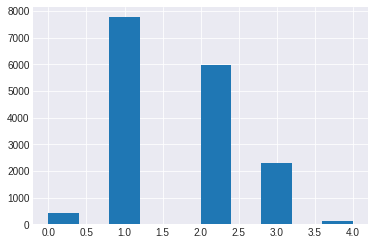

In [30]:
plt.hist(x = df_airbnb_entire_apartament['neighbourhood_group']);

In [31]:
plot = px.histogram(df_airbnb_entire_apartament, x = "neighbourhood")
plot.show()

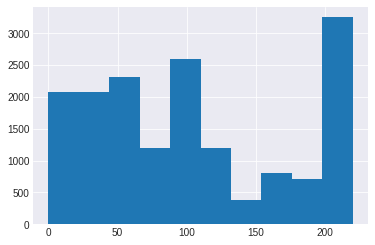

In [32]:
plt.hist(x = df_airbnb_entire_apartament['neighbourhood']);

In [33]:
plot = px.histogram(df_airbnb_entire_apartament, x = "neighbourhood")
plot.show()

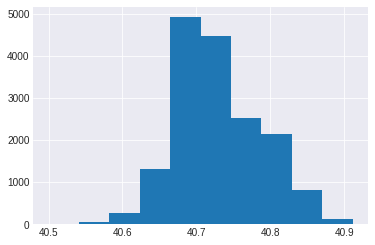

In [34]:
plt.hist(x = df_airbnb_entire_apartament['latitude']);

In [35]:
plot = px.histogram(df_airbnb_entire_apartament, x = "latitude")
plot.show()

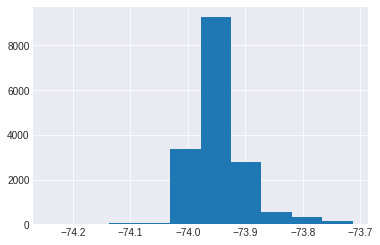

In [36]:
plt.hist(x = df_airbnb_entire_apartament['longitude']);

In [37]:
plot = px.histogram(df_airbnb_entire_apartament, x = "longitude")
plot.show()

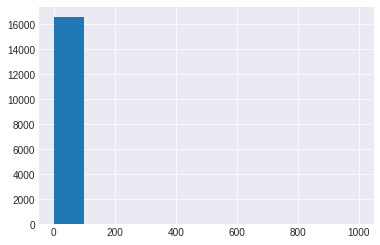

In [38]:
plt.hist(x = df_airbnb_entire_apartament['minimum_nights']);

In [39]:
# esse grafico aqui é mais detalhado do que o hist acima ("mais aberto")

plot = px.histogram(df_airbnb_entire_apartament, x = "minimum_nights")
plot.show()

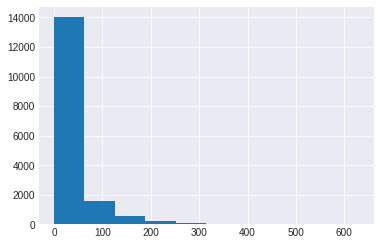

In [40]:
plt.hist(x = df_airbnb_entire_apartament['number_of_reviews']);

In [41]:
plot = px.histogram(df_airbnb_entire_apartament, x = 'number_of_reviews')
plot.show()

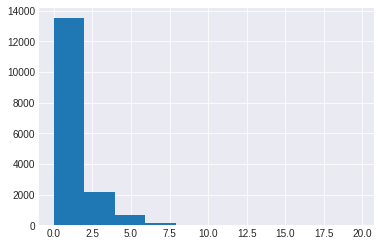

In [42]:
plt.hist(x = df_airbnb_entire_apartament['reviews_per_month']);

In [43]:
plot = px.histogram(df_airbnb_entire_apartament, x = 'reviews_per_month')
plot.show()

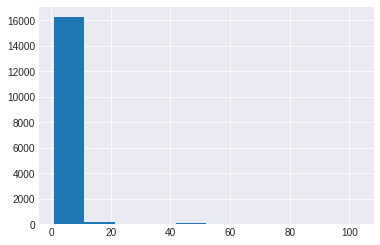

In [44]:
plt.hist(x = df_airbnb_entire_apartament['calculated_host_listings_count']);

In [45]:
plot = px.histogram(df_airbnb_entire_apartament, x = 'calculated_host_listings_count')
plot.show()

(array([8902., 1026., 1078.,  504.,  832.,  453.,  505.,  559.,  850.,
        1895.]),
 array([0.0, 36.5, 73.0, 109.5, 146.0, 182.5, 219.0, 255.5, 292.0, 328.5,
        365.0], dtype=object),
 <a list of 10 Patch objects>)

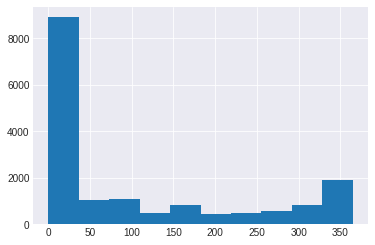

In [46]:
plt.hist(x = df_airbnb_entire_apartament['availability_365'])

In [47]:
plot = px.histogram(df_airbnb_entire_apartament , x= 'availability_365')
plot.show()

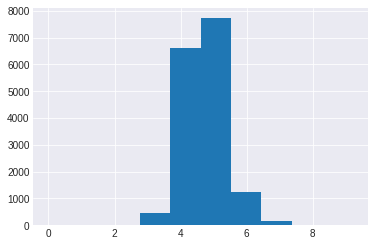

In [48]:
plt.hist(x = df_airbnb_entire_apartament['price_log']);

In [49]:
plot = px.histogram(df_airbnb_entire_apartament , x= 'price_log')
plot.show()

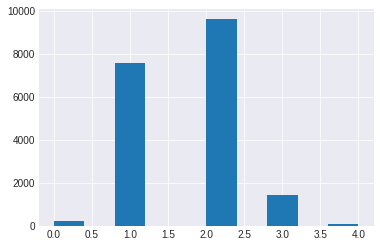

In [50]:
plt.hist(x = df_airbnb_privateroom['neighbourhood_group']);

In [51]:
plot = px.histogram(df_airbnb_privateroom, x = "neighbourhood")
plot.show()

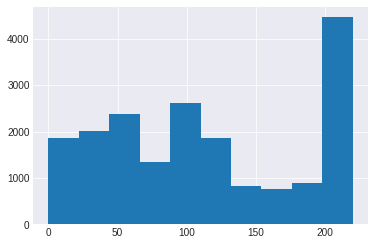

In [52]:
plt.hist(x = df_airbnb_privateroom['neighbourhood']);

In [53]:
plot = px.histogram(df_airbnb_privateroom, x = "neighbourhood")
plot.show()

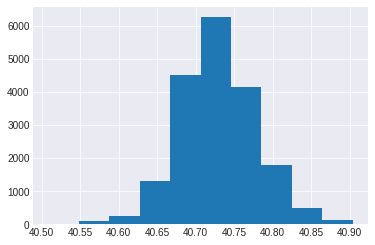

In [54]:
plt.hist(x = df_airbnb_privateroom['latitude']);

In [55]:
plot = px.histogram(df_airbnb_privateroom, x = "latitude")
plot.show()

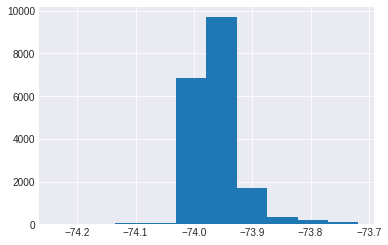

In [56]:
plt.hist(x = df_airbnb_privateroom['longitude']);

In [57]:
plot = px.histogram(df_airbnb_privateroom, x = "longitude")
plot.show()

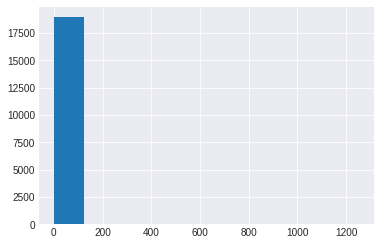

In [58]:
plt.hist(x = df_airbnb_privateroom['minimum_nights']);

In [59]:
# esse grafico aqui é mais detalhado do que o hist acima ("mais aberto")

plot = px.histogram(df_airbnb_privateroom, x = "minimum_nights")
plot.show()

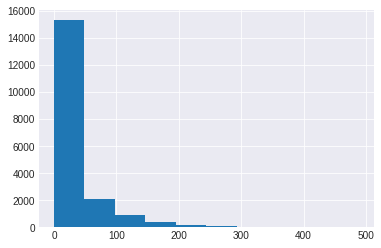

In [60]:
plt.hist(x = df_airbnb_privateroom['number_of_reviews']);

In [61]:
plot = px.histogram(df_airbnb_privateroom, x = 'number_of_reviews')
plot.show()

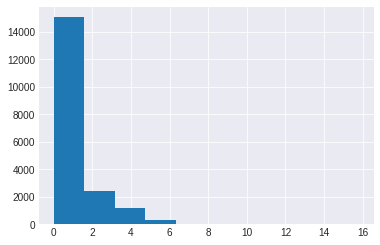

In [62]:
plt.hist(x = df_airbnb_privateroom['reviews_per_month']);

In [63]:
plot = px.histogram(df_airbnb_privateroom, x = 'reviews_per_month')
plot.show()

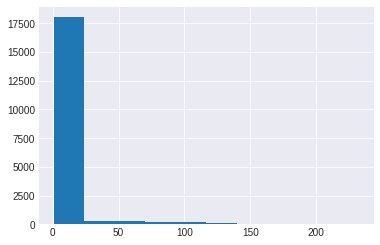

In [64]:
plt.hist(x = df_airbnb_privateroom['calculated_host_listings_count']);

In [65]:
plot = px.histogram(df_airbnb_privateroom, x = 'calculated_host_listings_count')
plot.show()

(array([10365.,  1038.,   887.,   594.,   828.,   768.,   852.,   973.,
          973.,  1736.]),
 array([0.0, 36.5, 73.0, 109.5, 146.0, 182.5, 219.0, 255.5, 292.0, 328.5,
        365.0], dtype=object),
 <a list of 10 Patch objects>)

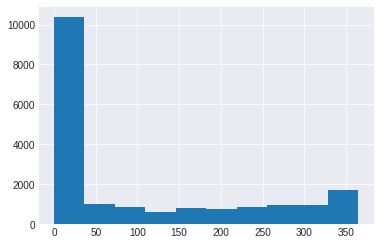

In [66]:
plt.hist(x = df_airbnb_privateroom['availability_365'])

In [67]:
plot = px.histogram(df_airbnb_privateroom , x= 'availability_365')
plot.show()

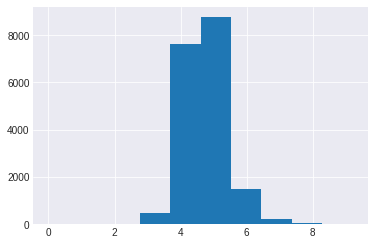

In [68]:
plt.hist(x = df_airbnb_privateroom['price_log']);

In [69]:
plot = px.histogram(df_airbnb_privateroom , x= 'price_log')
plot.show()

**R:**

Achando o mean e o deviation>


*texto em itálico*# --- 3 Bivariate analysis --- 

3. 

Perform a bi-variate analysis of the predictors. Specifically, you must plot the scatter
plots between all pairs of predictors. Investigate the existence of potential relationships
between pairs of predictors and the presence of potential outliers

previsores: neighbourhood_group,	room_type	minimum_nights,	number_of_reviews,	reviews_per_month,	availability_365

In [70]:
plot = px.scatter_matrix(df_airbnb_entire_apartament, dimensions= ['minimum_nights', 'number_of_reviews'])
plot.show()

In [71]:
plot = px.scatter_matrix(df_airbnb_privateroom, dimensions= ['minimum_nights', 'number_of_reviews'])
plot.show()

In [72]:
plot = px.scatter_matrix(df_airbnb_entire_apartament, dimensions= ['minimum_nights', 'reviews_per_month'])
plot.show()

In [73]:
plot = px.scatter_matrix(df_airbnb_privateroom, dimensions= ['minimum_nights', 'reviews_per_month'])
plot.show()

In [74]:
plot = px.scatter_matrix(df_airbnb_entire_apartament, dimensions= ['minimum_nights', 'neighbourhood_group'])
plot.show()

In [75]:
plot = px.scatter_matrix(df_airbnb_privateroom, dimensions= ['minimum_nights', 'neighbourhood_group'])
plot.show()

In [76]:
plot = px.scatter_matrix(df_airbnb_entire_apartament, dimensions= ['minimum_nights', 'room_type'])
plot.show()

In [77]:
plot = px.scatter_matrix(df_airbnb_privateroom, dimensions= ['minimum_nights', 'room_type'])
plot.show()

In [78]:
plot = px.scatter_matrix(df_airbnb_entire_apartament, dimensions= ['minimum_nights', 'availability_365'])
plot.show()

In [79]:
plot = px.scatter_matrix(df_airbnb_privateroom, dimensions= ['minimum_nights', 'availability_365'])
plot.show()

In [80]:
plot = px.scatter_matrix(df_airbnb_entire_apartament, dimensions= ['number_of_reviews', 'reviews_per_month'])
plot.show()

In [81]:
plot = px.scatter_matrix(df_airbnb_privateroom, dimensions= ['number_of_reviews', 'reviews_per_month'])
plot.show()

In [82]:
plot = px.scatter_matrix(df_airbnb_entire_apartament, dimensions= ['number_of_reviews', 'neighbourhood_group'])
plot.show()

In [83]:
plot = px.scatter_matrix(df_airbnb_privateroom, dimensions= ['number_of_reviews', 'neighbourhood_group'])
plot.show()

In [84]:
plot = px.scatter_matrix(df_airbnb_entire_apartament, dimensions= ['number_of_reviews', 'room_type'])
plot.show()

In [85]:
plot = px.scatter_matrix(df_airbnb_privateroom, dimensions= ['number_of_reviews', 'room_type'])
plot.show()

In [86]:
plot = px.scatter_matrix(df_airbnb_entire_apartament, dimensions= ['price_log', 'room_type'])
plot.show()

In [87]:
plot = px.scatter_matrix(df_airbnb_privateroom, dimensions= ['price_log', 'room_type'])
plot.show()

In [88]:
plot = px.scatter_matrix(df_airbnb_entire_apartament, dimensions= ['neighbourhood_group', 'room_type'])
plot.show()

In [89]:
plot = px.scatter_matrix(df_airbnb_privateroom, dimensions= ['neighbourhood_group', 'room_type'])
plot.show()

In [90]:
plot = px.scatter_matrix(df_airbnb_entire_apartament, dimensions= ['neighbourhood_group', 'reviews_per_month'])
plot.show()

In [91]:
plot = px.scatter_matrix(df_airbnb_privateroom, dimensions= ['neighbourhood_group', 'reviews_per_month'])
plot.show()

In [92]:
plot = px.scatter_matrix(df_airbnb_entire_apartament, dimensions= ['neighbourhood_group', 'availability_365'])
plot.show()

In [93]:
plot = px.scatter_matrix(df_airbnb_privateroom, dimensions= ['neighbourhood_group', 'availability_365'])
plot.show()

In [94]:
plot = px.scatter_matrix(df_airbnb_entire_apartament, dimensions= ['room_type', 'reviews_per_month'])
plot.show()

In [95]:
plot = px.scatter_matrix(df_airbnb_privateroom, dimensions= ['room_type', 'reviews_per_month'])
plot.show()

In [96]:
plot = px.scatter_matrix(df_airbnb_entire_apartament, dimensions= ['room_type', 'availability_365'])
plot.show()

In [97]:
plot = px.scatter_matrix(df_airbnb_privateroom, dimensions= ['room_type', 'availability_365'])
plot.show()

In [98]:
plot = px.scatter_matrix(df_airbnb_entire_apartament, dimensions= ['availability_365', 'reviews_per_month'])
plot.show()

In [99]:
plot = px.scatter_matrix(df_airbnb_privateroom, dimensions= ['availability_365', 'reviews_per_month'])
plot.show()

**3.2**

Are there any relevant relationships between pairs of predictors? If yes, are these relationships
linear? Quantify linear dependence between predictors using pair-wise correlation
coefficients $\rho d_1, \rho d_j $ , with di; dj = 1,...,D. Either tabulate the correlation coefficients as a
correlation matrix, or show the matrix as an image. Comment on the results.


**R:** 

Sim, notamos que existem relações entre diversos preditores, como exemplo, entre numeros minimo de noites e numeros de reviews, numero de reviews e numero de reviews mês.



**4** 
Perform a multi-variate analysis of the predictors. Specifically, you must perform a
principal components analysis of the predictors, retain only the first two principal
components (those associated with the two largest eigenvalues) and plot the scatter plot of the projected observations

**PCA COM BIB**

In [121]:
df = pd.read_csv('/content/AB_NYC_2019.csv')

In [122]:
df['neighbourhood_group']= df['neighbourhood_group'].astype("category").cat.codes
df['neighbourhood'] = df['neighbourhood'].astype("category").cat.codes
df['room_type'] = df['room_type'].astype("category").cat.codes

In [123]:
df['price_log'] = np.log(df.price+1)

In [124]:
df = df.drop(columns=['name','id' ,'host_id','host_name', 
                                   'last_review','price'])

In [125]:
mean = df['reviews_per_month'].mean()
df['reviews_per_month'].fillna(mean, inplace=True)

In [126]:
df_airbnb_privateroom = df[df['room_type'] == 0]
df_airbnb_privateroom = df_airbnb_privateroom.drop(columns=['room_type'])
df_airbnb_privateroom

,neighbourhood_group,neighbourhood,latitude,longitude,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,price_log
1,2,127,40.75362,-73.98377,1.0,45.0,0.380000,2.0,355.0,5.420535
3,1,41,40.68514,-73.95976,1.0,270.0,4.640000,1.0,194.0,4.499810
4,2,61,40.79851,-73.94399,10.0,9.0,0.100000,1.0,0.0,4.394449
5,2,137,40.74767,-73.97500,3.0,74.0,0.590000,1.0,129.0,5.303305
9,2,35,40.71344,-73.99037,1.0,160.0,1.330000,4.0,188.0,5.017280
...,...,...,...,...,...,...,...,...,...,...
36307,1,51,40.67294,-73.93655,3.0,33.0,3.610000,1.0,73.0,4.795791
36321,1,80,40.68832,-73.97731,3.0,38.0,4.150000,1.0,122.0,5.170484
36322,1,17,40.61135,-74.00827,23.0,0.0,1.142241,1.0,0.0,4.143135
36324,1,80,40.68631,-73.97497,8.0,4.0,0.500000,1.0,0.0,5.017280


In [106]:
 df_airbnb_entire_apartament = df[df['room_type'] == 1]
 df_airbnb_entire_apartament = df_airbnb_entire_apartament.drop(columns=['room_type'])
 df_airbnb_entire_apartament

,neighbourhood_group,neighbourhood,latitude,longitude,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,price_log
0,1,108,40.64749,-73.97237,1.0,9.0,0.210000,6.0,365.0,5.010635
2,2,94,40.80902,-73.94190,3.0,0.0,1.142241,1.0,365.0,5.017280
6,1,13,40.68688,-73.95596,45.0,49.0,0.400000,1.0,0.0,4.110874
7,2,95,40.76489,-73.98493,2.0,430.0,3.470000,1.0,220.0,4.382027
8,2,202,40.80178,-73.96723,2.0,118.0,0.990000,1.0,0.0,4.382027
...,...,...,...,...,...,...,...,...,...,...
36328,1,28,40.69454,-73.92612,2.0,54.0,5.790000,2.0,118.0,4.510860
36329,2,145,40.72135,-73.99426,3.0,2.0,0.220000,1.0,0.0,4.948760
36330,3,59,40.76173,-73.87417,1.0,58.0,6.190000,1.0,47.0,4.189655
36331,1,28,40.69677,-73.92688,1.0,1.0,0.120000,1.0,0.0,4.060443


[(10.0, 0.0)]

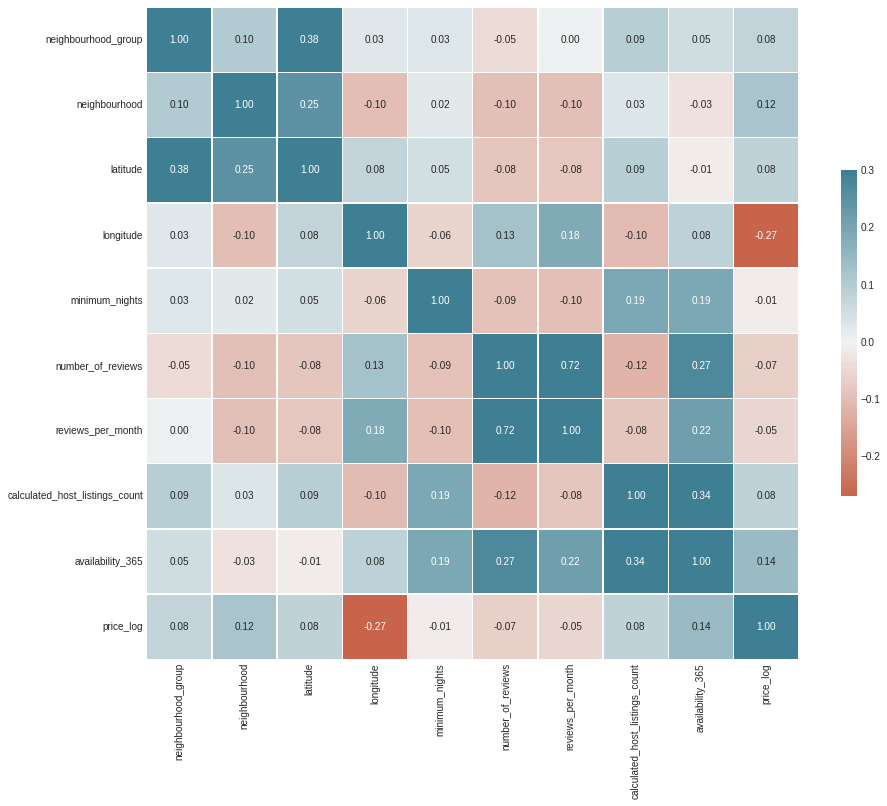

In [107]:
plt.figure(figsize=(15,12))
palette = sns.diverging_palette(20, 220, n=256)
corr=df_airbnb_privateroom.corr(method='pearson')
sns.heatmap(corr, annot=True, fmt=".2f", cmap=palette, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}).set(ylim=(10, 0))

[(10.0, 0.0)]

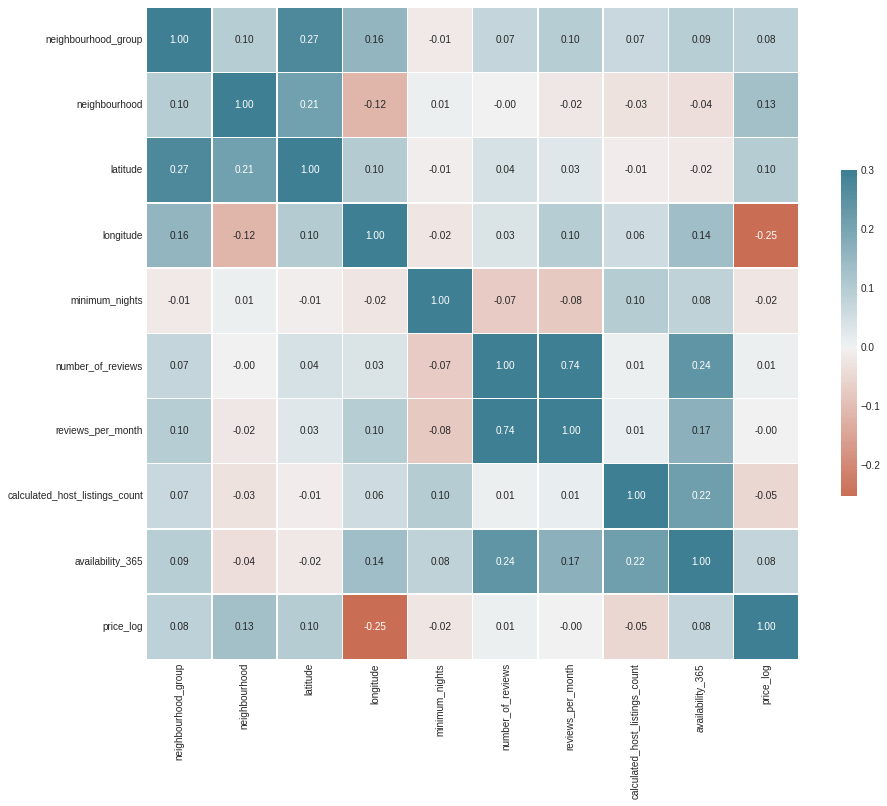

In [108]:
plt.figure(figsize=(15,12))
palette = sns.diverging_palette(20, 220, n=256)
corr=df_airbnb_entire_apartament.corr(method='pearson')
sns.heatmap(corr, annot=True, fmt=".2f", cmap=palette, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}).set(ylim=(10, 0))


Vemos que existe uma relação moderada entre número de reviews por mês e número de reviews 0.3 $\leq$ |r| $<$0.7 e as outras relações são fracas 0.0 $\leq$ |r| $<$0.3

> Bloco com recuo

> Bloco com recuo





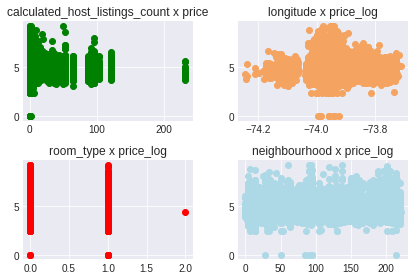

In [109]:
fig, axs = plt.subplots(2, 2)
axs[0, 0].scatter(df_airbnb['calculated_host_listings_count'], df_airbnb['price_log'],color = 'green')
axs[0, 0].set_title("calculated_host_listings_count x price")
axs[1, 0].scatter(df_airbnb['room_type'], df_airbnb['price_log'],color = 'red')
axs[1, 0].set_title("room_type x price_log")
axs[0, 1].scatter(df_airbnb['longitude'], df_airbnb['price_log'],color = 'sandybrown')
axs[0, 1].set_title("longitude x price_log")
axs[1, 1].scatter(df_airbnb['neighbourhood'], df_airbnb['price_log'],color = 'lightblue')
axs[1, 1].set_title("neighbourhood x price_log")
fig.tight_layout()

In [131]:
df = df.dropna()

In [154]:
df

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,price_log
0,1,108,40.64749,-73.97237,1,1.0,9.0,0.210000,6.0,365.0,5.010635
1,2,127,40.75362,-73.98377,0,1.0,45.0,0.380000,2.0,355.0,5.420535
2,2,94,40.80902,-73.94190,1,3.0,0.0,1.142241,1.0,365.0,5.017280
3,1,41,40.68514,-73.95976,0,1.0,270.0,4.640000,1.0,194.0,4.499810
4,2,61,40.79851,-73.94399,0,10.0,9.0,0.100000,1.0,0.0,4.394449
...,...,...,...,...,...,...,...,...,...,...,...
36328,1,28,40.69454,-73.92612,1,2.0,54.0,5.790000,2.0,118.0,4.510860
36329,2,145,40.72135,-73.99426,1,3.0,2.0,0.220000,1.0,0.0,4.948760
36330,3,59,40.76173,-73.87417,1,1.0,58.0,6.190000,1.0,47.0,4.189655
36331,1,28,40.69677,-73.92688,1,1.0,1.0,0.120000,1.0,0.0,4.060443


In [155]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df = scaler.fit_transform(df)

In [156]:
column_names = ['neighbourhood_group',	'neighbourhood','latitude',	'longitude',	'room_type',	'minimum_nights',	'number_of_reviews',	'reviews_per_month',	'calculated_host_listings_count',	'availability_365','price_log']
df = pd.DataFrame(df, columns = column_names)

In [157]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(df)
components = pca.fit_transform(df)

In [158]:
X = pca.transform(df)
pca_airbnb = pd.DataFrame(X, columns = ['pc1', 'pc2'])
price= df[df['price_log'].notna()]
price.reset_index(drop=True, inplace=True)
df_pca = pca_airbnb
df_pca['price_log'] = price['price_log']
df_pca

,pc1,pc2,price_log
0,-0.032570,-0.216612,0.433383
1,-0.853784,1.681184,1.043515
2,0.300668,0.531997,0.443273
3,3.693226,3.081087,-0.326976
4,-0.714216,-0.496766,-0.483804
...,...,...,...
36328,2.949073,0.560566,-0.310528
36329,-0.877406,-0.833226,0.341282
36330,3.446543,0.980548,-0.788638
36331,0.566341,-2.225928,-0.980969


In [159]:
print("auto vetores:")
print(pca.components_)
print()

auto vetores:
[[-0.01328323 -0.20479754 -0.0728074   0.34880669  0.37210465 -0.15059409
   0.46631816  0.48429063 -0.14805864  0.16407556 -0.41102538]
 [ 0.21380077  0.13978482  0.14491091 -0.10812925 -0.38925907  0.11292383
   0.43043078  0.40131203  0.23699816  0.37776688  0.43884617]]



In [160]:
print("auto valores:")
print(pca.explained_variance_)
print()

auto valores:
[2.01376643 1.76327523]



In [161]:
print(pca.explained_variance_ratio_)
print(pca.singular_values_)

[0.18306464 0.16029334]
[270.48874666 253.10732076]


Vemos que com 2 Principais Componentes não conseguimos alcançar uma bom valor de variance, assim, para reduzir a dimensão sem perder tanta precisão precisamos de mais componentes

Vamos agorar gerar o novo df com os dois principais componentes

SCREE PLOT 

[0.18306464 0.16029334 0.13246112 0.12036591 0.08565317 0.07618745]


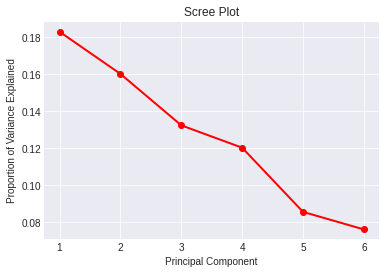

In [162]:
pca = PCA(n_components=6)
pca.fit(df)
PC_values = np.arange(pca.n_components_) + 1
print(pca.explained_variance_ratio_)
plt.plot(PC_values, pca.explained_variance_ratio_, 'ro-', linewidth=2)
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')
plt.show()

Scatter plot:

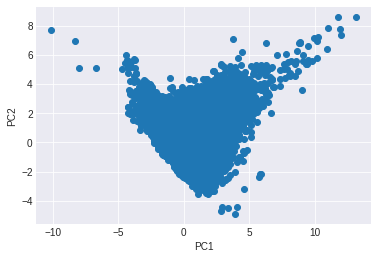

In [163]:
plt.scatter(X[:,0], X[:,1])
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

BIPLOT

In [142]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
features = ['minimum_nights', 'number_of_reviews', 'reviews_per_month', 'availability_365', 'latitude','longitude','neighbourhood_group', 'room_type','neighbourhood']
fig = px.scatter(components, x=0, y=1)

for i, feature in enumerate(features):
    fig.add_shape(
        type='line',
        x0=0, y0=0,
        x1=loadings[i, 0],
        y1=loadings[i, 1]
    )
    fig.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=feature,
        arrowcolor='red',
    )
  
fig.show()

